# Exploratory Data Analysis

<hr />

## Import libraries

In [1]:
import pandas as pd
import openpyxl
from matplotlib import pyplot as plt
import spacy
import seaborn as sns
import altair as alt
alt.renderers.enable('mimetype')

RendererRegistry.enable('mimetype')

<hr />



## Read in excel file to pandas

In [2]:
api_df = pd.read_excel(
    "../data/raw/RiskClassification_Data_Endpoints_V1.xlsx",
    "Core_Endpoint",
    usecols="A:R",
)
api_df.head()

,api_endpoint_id,api_id,api_vendor_id,api_vendor,api,category,usage_base,sample_response,tagset,authentication,security_test_category,security_test_result (FALSE=Passed; TRUE=Failed),server_location,hosting_isp,server_name,response_metadata,hosting city,risk_label_Baljeet
0,2410,1045,361,OneLook,Datamuse Dictionary,Research & Education,free,NaN,"tags,score,word,word,word",none,Broken Authentication,0.0,United States,"Amazon.com, Inc.",Apache/2.4.33 (Amazon) mod_wsgi/3.5 Python/2.7...,"{""Date"": ""Fri, 08 Nov 2019 14:43:17 GMT"", ""Var...",Ashburn,Low
1,2410,1045,361,OneLook,Datamuse Dictionary,Research & Education,free,NaN,"tags,score,word,word,word",none,Broken Authentication,0.0,United States,"Amazon.com, Inc.",Unavailable/Obscured,"{""Date"": ""Fri, 08 Nov 2019 14:43:17 GMT"", ""Var...",Ashburn,No
2,2410,1045,361,OneLook,Datamuse Dictionary,Research & Education,free,NaN,"tags,score,word,word,word",none,Cross-Site Scripting,0.0,United States,"Amazon.com, Inc.",Apache/2.4.33 (Amazon) mod_wsgi/3.5 Python/2.7...,"{""Date"": ""Fri, 08 Nov 2019 14:43:18 GMT"", ""Var...",Ashburn,Low
3,2410,1045,361,OneLook,Datamuse Dictionary,Research & Education,free,NaN,"tags,score,word,word,word",none,Cross-Site Scripting,0.0,United States,"Amazon.com, Inc.",Apache/2.4.33 (Amazon) mod_wsgi/3.5 Python/2.7...,NaN,Ashburn,Low
4,2410,1045,361,OneLook,Datamuse Dictionary,Research & Education,free,NaN,"tags,score,word,word,word",none,Cross-Site Scripting,0.0,United States,"Amazon.com, Inc.",Unavailable/Obscured,"{""Date"": ""Fri, 08 Nov 2019 14:43:18 GMT"", ""Var...",Ashburn,No


<hr />



## Pre-processing

In [3]:
api_df.rename(columns={'security_test_result (FALSE=Passed; TRUE=Failed)': 'security_test_result', 'risk_label_Baljeet': 'risk_label'}, inplace=True)
api_df['security_test_result'] = api_df['security_test_result'].astype('bool')
api_df['Is_server_name'] = ((api_df['server_name'] != 'Unavailable/Obscured') & (api_df['server_name'] != '')).astype('bool')
api_df_preprocessed = api_df.drop(['response_metadata'], axis=1)
api_df.loc[api_df['hosting_isp'] == 'Amazon Technologies Inc.', 'hosting_isp'] = 'Amazon.com, Inc.'
api_df_preprocessed.loc[api_df_preprocessed['hosting_isp'] == 'Amazon Technologies Inc.', 'hosting_isp'] = 'Amazon.com, Inc.'
# Combine the Security Test Category and the result
api_df_preprocessed['security_test_result_combined'] = api_df_preprocessed['security_test_category'] + ':' + api_df_preprocessed['security_test_result'].astype(str)
api_df = api_df.drop_duplicates()
api_df_preprocessed = api_df_preprocessed.drop_duplicates()

<hr />



## Distribution of target variable 

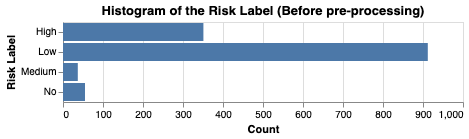

In [4]:
alt.Chart(api_df, title="Histogram of the Risk Label (Before pre-processing)").mark_bar().encode(
    y=alt.Y("risk_label", type="nominal", title="Risk Label"),
    x=alt.X("count()", title="Count")
)

> Skewness problem was found in particular labels such as "High" and "Low" compared to other labels.

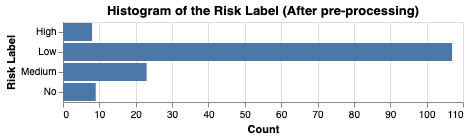

In [5]:
alt.Chart(api_df_preprocessed, title="Histogram of the Risk Label (After pre-processing)").mark_bar().encode(
    y=alt.Y("risk_label", type="nominal", title="Risk Label"),
    x=alt.X("count()", title="Count")
)

> After we wrangled the data, the data was less skewed than before. However, it came to another problem. There was a insufficient data problem in the risk labels except the "Low" label, which may not be representative enough to reflect the ground truth. 

<hr />

## Histogram of all Categorical Features

In [6]:
categorical_features = [
    "category",
    "usage_base",
    "authentication",
    "security_test_result_combined",
    "server_location",
    "hosting_isp",
    "hosting city",
]

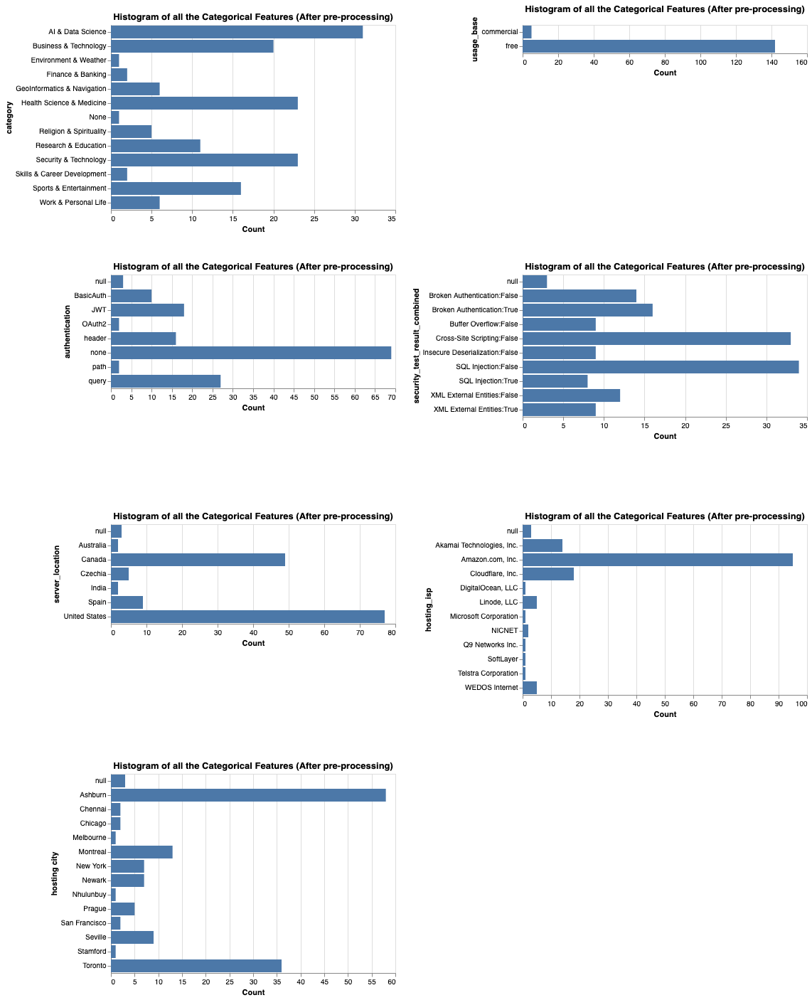

In [27]:
alt.Chart(
    api_df_preprocessed, title="Histogram of all the Categorical Features (After pre-processing)"
).mark_bar().encode(
    y=alt.Y(alt.repeat(), type="nominal"), x=alt.X("count()", title="Count")
).repeat(
    categorical_features, columns=2
)

<hr />



## Distribution of Risk Label by Unique API Endpoint

In [8]:
api_df.groupby(['api_endpoint_id', 'risk_label']).size()

api_endpoint_id  risk_label
2410             Low             8
                 No              8
2524             Low             1
2532             Low             1
2544             High            4
                 Low            16
2545             Low            60
2546             Low             9
2548             Low             1
2583             Low             4
2585             High           16
                 Low            18
2600             Low            16
2601             Low            10
                 Medium          3
2612             Low             2
                 No             46
2628             Low            18
2677             Low            14
                 Medium          5
2681             Low            21
                 Medium          1
2687             Low            44
                 Medium          7
2699             Low            10
2702             High           45
                 Low            26
                 Medium    

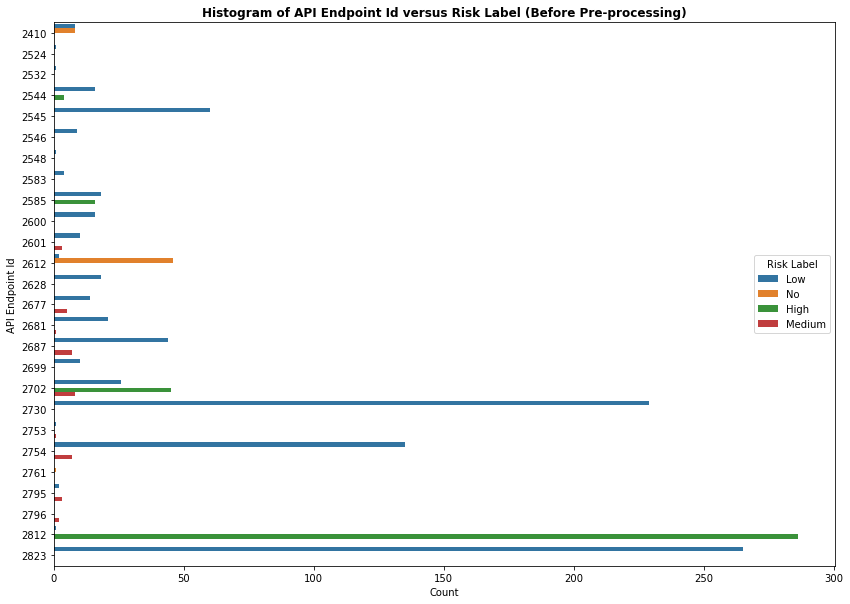

In [9]:
plt.figure(figsize=(14, 10))
sns.countplot(y="api_endpoint_id", data=api_df, hue="risk_label").set(
    xlabel="Count", ylabel="API Endpoint Id"
)
plt.title(
    "Histogram of API Endpoint Id versus Risk Label (Before Pre-processing)",
    weight="bold",
)
plt.legend(title="Risk Label")

> Before pre-processing, the risk labels were heavily biased towards specific API endpoints (e.g. 90% of high risk labels fell into 2812).

In [10]:
api_df_preprocessed.groupby(['api_endpoint_id', 'risk_label']).size()

api_endpoint_id  risk_label
2410             Low            5
                 No             5
2524             Low            1
2532             Low            1
2544             High           2
                 Low            4
2545             Low            9
2546             Low            1
2548             Low            1
2583             Low            1
2585             High           4
                 Low            6
2600             Low            5
2601             Low            3
                 Medium         2
2612             Low            2
                 No             3
2628             Low           18
2677             Low           13
                 Medium         5
2681             Low            1
                 Medium         1
2687             Low            9
                 Medium         7
2699             Low            2
2702             High           1
                 Low            5
                 Medium         1
2730             Low

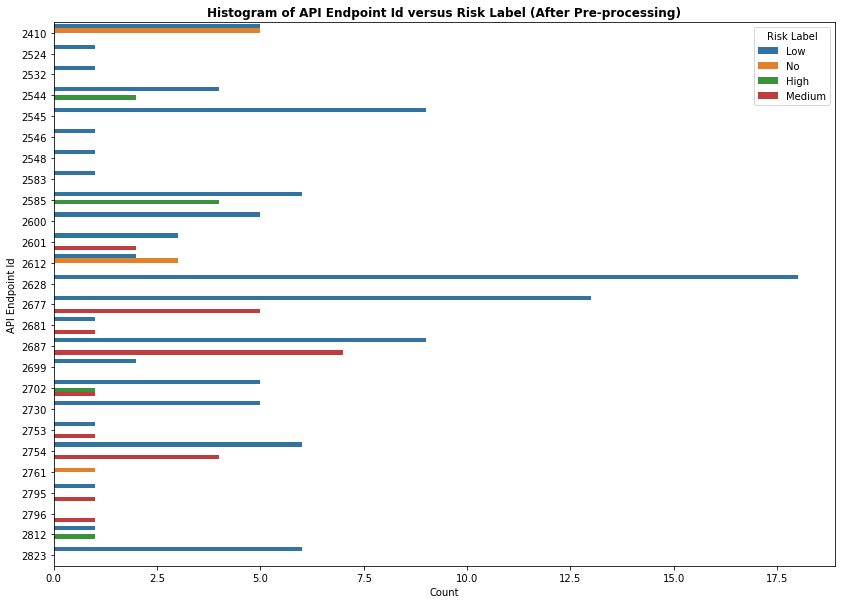

In [11]:
plt.figure(figsize=(14, 10))
sns.countplot(y="api_endpoint_id", data=api_df_preprocessed, hue="risk_label").set(
    xlabel="Count",
    ylabel="API Endpoint Id",
)
plt.title('Histogram of API Endpoint Id versus Risk Label (After Pre-processing)', weight='bold')
plt.legend(title="Risk Label")

> After the pre-processing step, the distribution of API endpoint Id versus Risk label was less skewed.

<hr />

## Distribution of Categorical Variables by Risk Labels

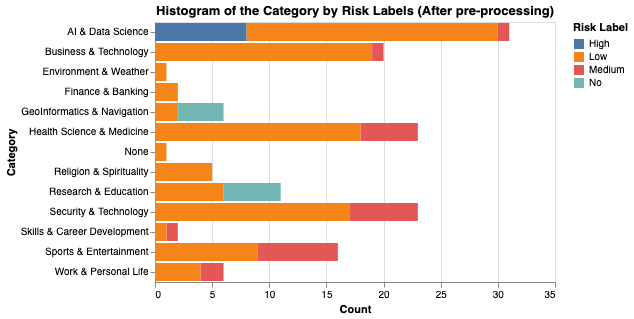

In [12]:
alt.Chart(api_df_preprocessed, title="Histogram of the Category by Risk Labels (After pre-processing)").mark_bar().encode(
    y=alt.Y("category", type="nominal", title="Category"),
    x=alt.X("count()", title="Count"),
    color=alt.Color("risk_label", title="Risk Label")
)

> High Risk label was too skewed towards AI & Data Science. Meanwhile, sample sizes across other categories were quite small.

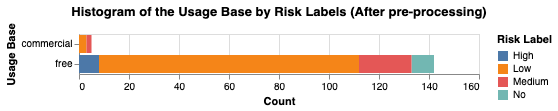

In [13]:
alt.Chart(api_df_preprocessed, title="Histogram of the Usage Base by Risk Labels (After pre-processing)").mark_bar().encode(
    y=alt.Y("usage_base", type="nominal", title="Usage Base"),
    x=alt.X("count()", title="Count"),
    color=alt.Color("risk_label", title="Risk Label")
)

> The problem here was the data points from commercial APIs were considerably small when compared to free.

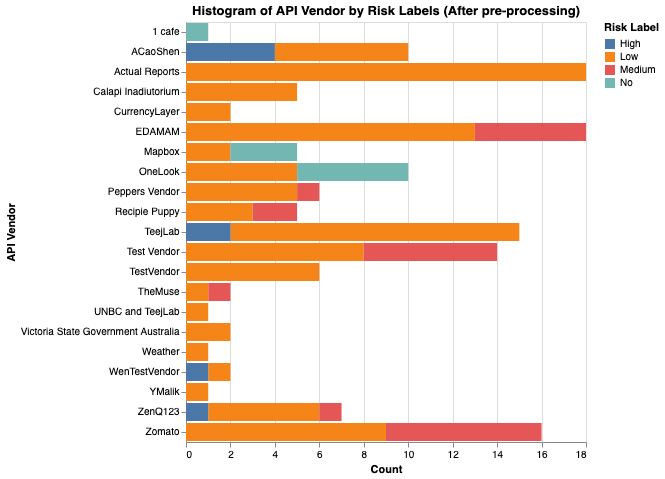

In [14]:
alt.Chart(api_df_preprocessed, title="Histogram of API Vendor by Risk Labels (After pre-processing)").mark_bar().encode(
    y=alt.Y("api_vendor", type="nominal", title="API Vendor"),
    x=alt.X("count()", title="Count"),
    color=alt.Color("risk_label", title="Risk Label")
)

> The problem here was the data points  were considerably small. We cannot draw a statistical conclusion that the certain level of risk labels is associated with certain API vendor (e.g. High Risk <-> TeejLab)

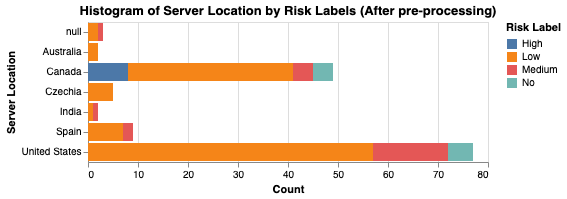

In [15]:
alt.Chart(api_df_preprocessed, title="Histogram of Server Location by Risk Labels (After pre-processing)").mark_bar().encode(
    y=alt.Y("server_location", type="nominal", title="Server Location"),
    x=alt.X("count()", title="Count"),
    color=alt.Color("risk_label", title="Risk Label")
)

> Most of the high risk labels were skewed towards Canada, which may not reflect the ground truth.

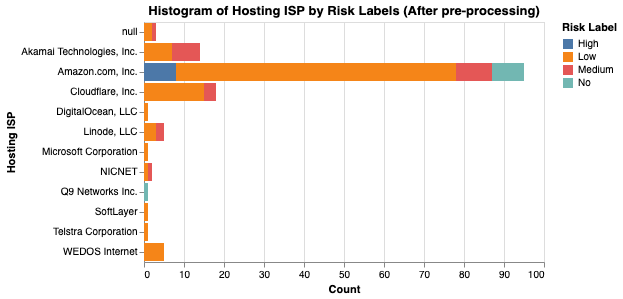

In [16]:
alt.Chart(api_df_preprocessed, title="Histogram of Hosting ISP by Risk Labels (After pre-processing)").mark_bar().encode(
    y=alt.Y("hosting_isp", type="nominal", title="Hosting ISP"),
    x=alt.X("count()", title="Count"),
    color=alt.Color("risk_label", title="Risk Label")
)

> Most of the high risk labels were skewed towards Amazon, which may not reflect the ground truth.

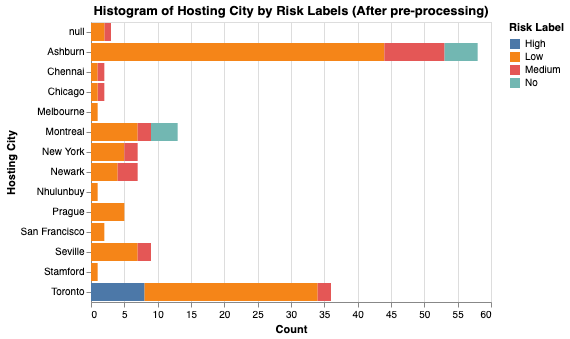

In [17]:
alt.Chart(api_df_preprocessed, title="Histogram of Hosting City by Risk Labels (After pre-processing)").mark_bar().encode(
    y=alt.Y("hosting city", type="nominal", title="Hosting City"),
    x=alt.X("count()", title="Count"),
    color=alt.Color("risk_label", title="Risk Label")
)

> Most of the high risk labels were skewed towards Toronto, which may not reflect the ground truth.

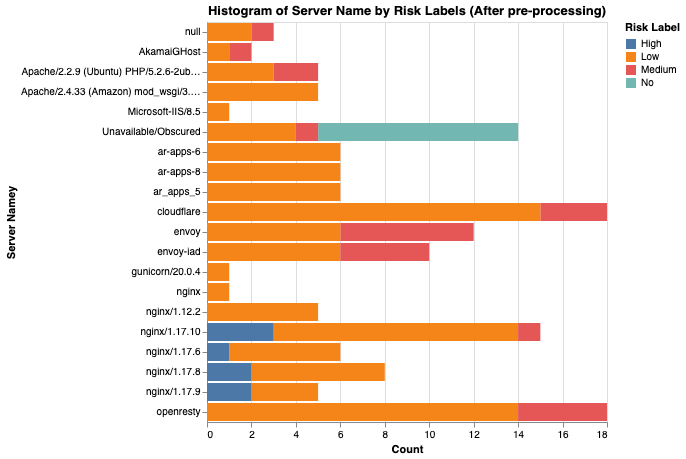

In [18]:
alt.Chart(api_df_preprocessed, title="Histogram of Server Name by Risk Labels (After pre-processing)").mark_bar().encode(
    y=alt.Y("server_name", type="nominal", title="Server Name"),
    x=alt.X("count()", title="Count"),
    color=alt.Color("risk_label", title="Risk Label")
)

> So far all the high risk labels were associated with nginx. Further analysis should be conducted when more data are ready.

<hr />



## Security Test Category versus Risk Label

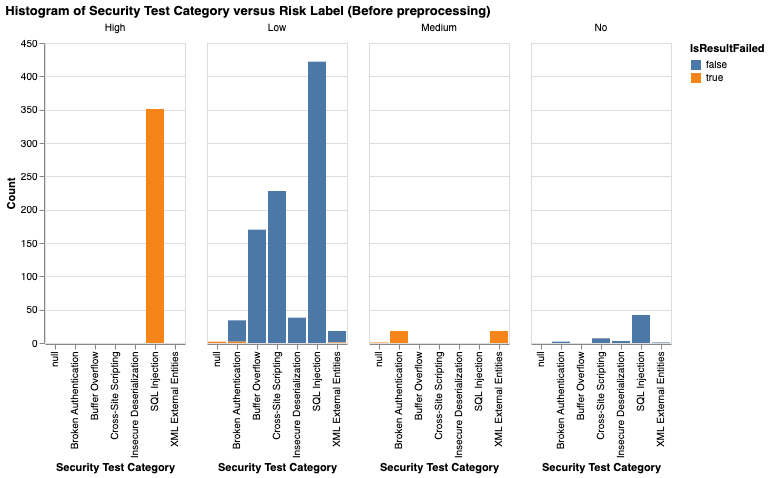

In [19]:
alt.Chart(api_df).mark_bar().encode(
    x=alt.X("security_test_category", title="Security Test Category", type="nominal"),
    color=alt.Color("security_test_result", title="IsResultFailed"),
    y=alt.Y("count()", title="Count"),
).facet(
    facet=alt.Facet("risk_label", title=None),
    title="Histogram of Security Test Category versus Risk Label (Before preprocessing)",
)

> Before pre-processing, the high risk labels were heavily biased (e.g. almost 99% of high risk labels fell into failed SQL Injection test).

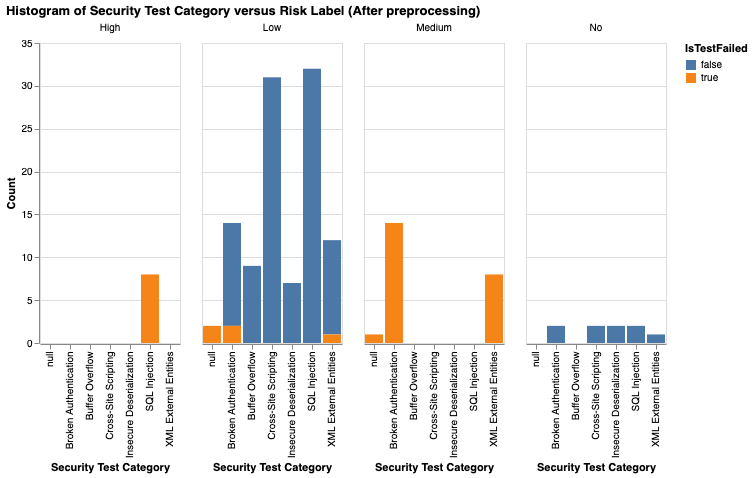

In [20]:
alt.Chart(api_df_preprocessed).mark_bar().encode(
    x=alt.X("security_test_category", title="Security Test Category", type="nominal"),
    color=alt.Color("security_test_result", title="IsTestFailed"),
    y=alt.Y("count()", title="Count"),
).facet(
    facet=alt.Facet("risk_label", title=None),
    title="Histogram of Security Test Category versus Risk Label (After preprocessing)",
)

> After pre-processing, the data was less skewed but the sample size was not big enough to dig out the patterns of high and medium risk label.

<hr />



## Authentication versus Risk Label

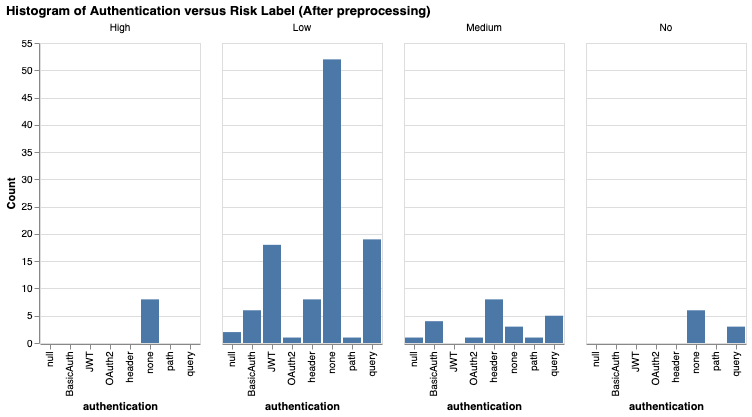

In [21]:
alt.Chart(api_df_preprocessed).mark_bar().encode(
    x=alt.X("authentication", type="nominal"),
    y=alt.Y("count()", title="Count")
).facet(
    facet=alt.Facet("risk_label", title=None),
    title="Histogram of Authentication versus Risk Label (After preprocessing)",
)

> Graphically speaking, 'None' authentication was the only feature assoicated with high risk label. But since there were also high proportion of None authentication on other labels and the samples size was not large enough, more data is needed to make such statistical hypothesis.

<hr />

## Server name versus Risk Label

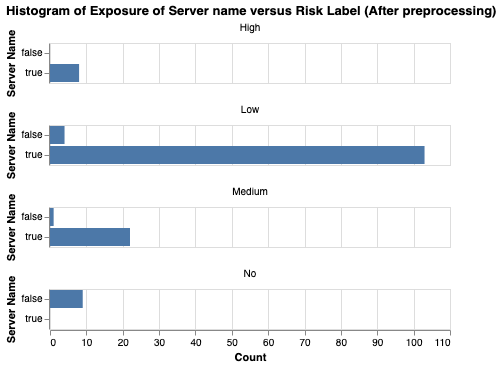

In [22]:
alt.Chart(api_df_preprocessed).mark_bar().encode(
    y=alt.Y("Is_server_name", title="Server Name", type="nominal"),
    x=alt.X("count()", title="Count")
).facet(
    facet=alt.Facet("risk_label", title=None),
    columns=1,
    title="Histogram of Exposure of Server name versus Risk Label (After preprocessing)",
)

> We cannot make a statistical conclusion that leaking server name information is assoicated with the risk label. More data is required for further analysis.

<hr />



## Correlation between categorical variables

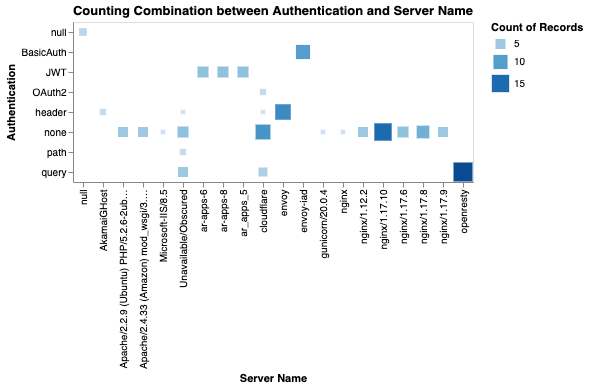

In [23]:
alt.Chart(
    api_df_preprocessed,
    title="Counting Combination between Authentication and Server Name",
).mark_square().encode(
    x=alt.X("server_name", title="Server Name"),
    y=alt.Y("authentication", title="Authentication"),
    color="count()",
    size="count()",
)

> The authentication method "query" was highly correlated to the server "openresty". Most of the "None" Authentication also lied on the servers "nginx" and "cloudflare".

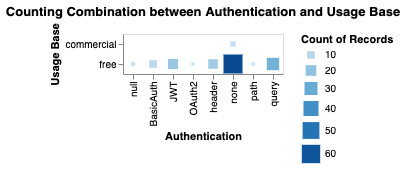

In [24]:
alt.Chart(
    api_df_preprocessed,
    title="Counting Combination between Authentication and Usage Base",
).mark_square().encode(
    x=alt.X("authentication", title="Authentication"), y=alt.Y("usage_base", title="Usage Base"), color="count()", size="count()"
)

> Free API was highly correlated with 'None' Authentication.

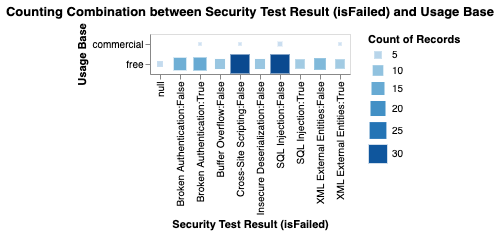

In [25]:
alt.Chart(
    api_df_preprocessed,
    title="Counting Combination between Security Test Result (isFailed) and Usage Base",
).mark_square().encode(
    x=alt.X("security_test_result_combined", title="Security Test Result (isFailed)"),
    y=alt.Y("usage_base", title="Usage Base"),
    color="count()",
    size="count()",
)

> Passed Result of Cross Site Scripting and SQL Injection were highly correlated with Free API.

## 